## **Disclaimer:**

This notebook is provided solely for educational purposes and is not intended for production use or as a demonstration of state-of-the-art performance. The code and results here are meant to illustrate potential applications of clustering for video analysis, helping you understand the workflow and concepts rather than to deliver optimized or production‐ready solutions.


# Potential Applications of Clustering for Video Analysis

In this notebook, you’ll learn how to transform raw video into meaningful, multimodal insights by extracting frames, computing deep visual embeddings, and exploring temporal clusters. We start by installing necessary libraries (e.g., OpenCLIP, PyTorch, Llava) and defining helper functions to extract video frames at a fixed frame rate. After building a PyTorch DataLoader for those frames, we use SigLIP2 to generate feature vectors, apply t-SNE for 2D visualization, and employ FINCH clustering to discover coherent temporal segments. Once clusters are identified, we compute cluster centroids in embedding space and demonstrate how to perform text-based retrieval of segments using a CLIP model. Finally, we show how to extract GIFs from the original video for top clusters and leverage the Llava vision-language model to generate detailed natural-language descriptions of what’s happening in each cluster. By the end of this tutorial, you’ll have end-to-end code for video frame extraction, feature extraction, clustering, visualization, retrieval, and multimodal description.



In [27]:
# Install or import necessary packages
import os
import json
import tempfile
from pathlib import Path
import subprocess
import shlex
from torch.utils.data import DataLoader
from torchvision import transforms
import matplotlib.pyplot as plt
from collections import defaultdict
import math
import glob
import numpy as np
import torch
from open_clip import create_model_from_pretrained, get_tokenizer
from transformers import LlavaProcessor, LlavaForConditionalGeneration
from PIL import Image

## Import Helper functions
This cell pulls in all of our custom utilities.

- video_helpers: functions to extract video frames and generate GIFs, and to compute time slots from FINCH cluster assignments.

- visualize: t-SNE routines (apply_tsne, plot_tsne, plot_multiple_tsne), cluster‐image plotting, and a timeline visualization function.

- data: a simple ImageFolderDataset class (to load frames) and get_transforms (preprocessing pipeline).

- feature_extraction: a wrapper around SigLIP2 feature extraction plus a dictionary of pretrained model names.

- twfinch: our FINCH clustering implementation.

These helpers allow us to keep the core notebook clean and focused on the overall workflow.



In [2]:
from utils.video_helpers import extract_frames, extract_gifs_from_video, get_time_slots_per_clusterings
from utils.visualize import apply_tsne, plot_tsne, plot_multiple_tsne, plot_cluster_images, plot_label_timeline
from utils.data import ImageFolderDataset, get_transforms
from utils.feature_extraction import extract_features, model_dict
from utils.twfinch import FINCH

/Users/constantinseibold/workspace/CVPR_Tutorial/Identifying_Structure_In_Data/clustering/image_clustering/utils/twfinch.py:13: UserWarning: pynndescent not installed: No module named 'pynndescent'
  warnings.warn('pynndescent not installed: {}'.format(e))


In [3]:
temp_dir = './tmp_data'
video_path = '/Users/constantinseibold/Downloads/(02) Mountains.ia.mp4'
_ = extract_frames(
    video_path,
    temp_dir,
    fps_target = 2
    )

Running FFmpeg to extract frames...
FFmpeg extraction completed.
Total extracted frames: 6908 (location: tmp_data)


## Compute Multimodal Embeddings

Here, we:

- Build a PyTorch DataLoader over the extracted frames, applying any necessary image transformations (resizing, normalization, etc.).

- Use SigLIP2 (via extract_features) to generate a high‐dimensional feature vector for each frame, automatically moving computation to GPU (or MPS on macOS) if available.

- Print the shape of the resulting feature matrix to confirm that every frame now has a corresponding embedding.

- Save a JSON file (embeddings.json) that contains a list of file paths and their associated feature vectors (converted to plain Python lists). This JSON can be loaded later for clustering, visualization, or retrieval tasks.


In [4]:


# Create dataset and dataloader
transform = get_transforms()

dataset = ImageFolderDataset(root=temp_dir, transform=transform)
dataloader = DataLoader(dataset, batch_size=32, shuffle=False)

# Extract features using SigLIP2
device = 'mps' if torch.cuda.is_available() else 'cpu'
features, _ = extract_features(tag='siglip2', dataloader=dataloader, device=device)
print(f"Features shape: {features.shape}")

# Save embeddings and metadata to JSON
embeddings = {
    'paths': dataset.get_image_paths(),
    'features': features.tolist()
}
json_path = Path(temp_dir) / 'embeddings.json'
with open(json_path, 'w') as f:
    json.dump(embeddings, f)
print(f"Saved embeddings JSON to {json_path}")

Loading Model: siglip2


/Users/constantinseibold/workspace/CVPR_Tutorial/Identifying_Structure_In_Data/clustering/image_clustering/utils/feature_extraction.py:47: FutureWarning: `torch.cuda.amp.autocast(args...)` is deprecated. Please use `torch.amp.autocast('cuda', args...)` instead.
  with torch.no_grad(), torch.cuda.amp.autocast():
/opt/anaconda3/envs/tutorial/lib/python3.11/site-packages/torch/amp/autocast_mode.py:266: UserWarning: User provided device_type of 'cuda', but CUDA is not available. Disabling
  warnings.warn(


Loaded Model: siglip2
Beginning Feature Extraction


100%|██████████| 216/216 [04:54<00:00,  1.36s/it]


feature shape (6908, 768)
labels shape (6908,)
Features shape: (6908, 768)
Saved embeddings JSON to tmp_data/embeddings.json


Now that we have a matrix of frame‐level features, we apply t-SNE to project each embedding into two dimensions for exploratory visualization. The plot_tsne call renders a scatterplot where every point is plotted just to confirm that the 2D reduction ran properly. Later, we’ll color points by cluster labels to inspect how well FINCH separated them.

Visualize Embeddings


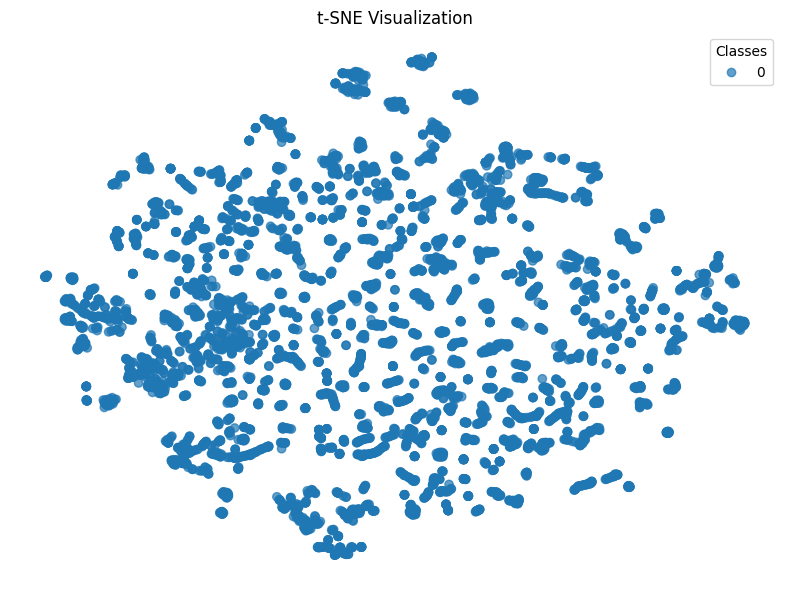

In [5]:
reduced = apply_tsne(features, n_components=2, perplexity=30)
plot_tsne(reduced, labels=[0]*len(reduced))


## TW-FINCH clustering 

This cell does the following:

-   Run FINCH clustering on the high‐dimensional features array (setting tw_finch=True to apply timeline constraints). The output c has shape (num_frames, num_clusterings), where each column is a different hierarchical clustering solution.

-   Print out how many clusters were found at each stage (stored in num_clust).

-   Use get_time_slots_per_clusterings to convert each FINCH clustering assignment into contiguous time segments. This returns a nested list of (start_frame, end_frame) pairs for each cluster in each hierarchy.

-   Convert the list of frame file paths into a NumPy array so that we can more easily select subsets.

-   Choose one specific clustering level (e.g., cluster_id = 3) and plot:

    -   A t-SNE embedding colored by cluster assignments at that level.

    -   A timeline that shows where each cluster appears in the video.

    -   Collages of representative frames from each cluster (up to 16 images per cluster, arranged in a grid).

These visualizations let us inspect whether clusters correspond to semantically coherent chunks of the video (e.g., “mountains only,” “snowy peaks,” “close‐ups,” etc.).

The number of the found clusters in the individual clusterings is:  [2150, 687, 219, 69, 24, 5]
Cluster Visualization based on the extracted embeddings and T-SNE
Visualize Embeddings


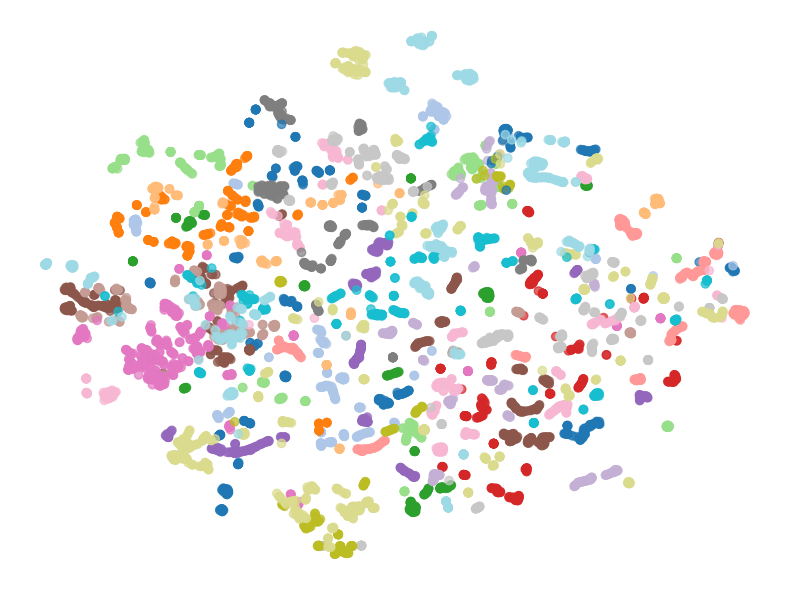

Visualization of the clusters along the timeline


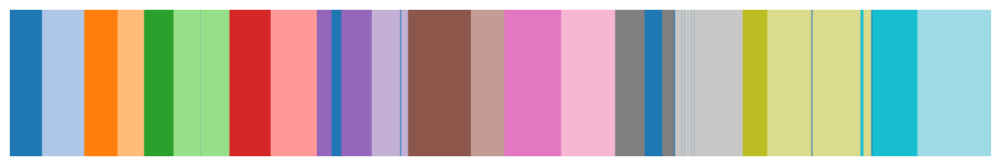

Visualization of samples within the individual clusters


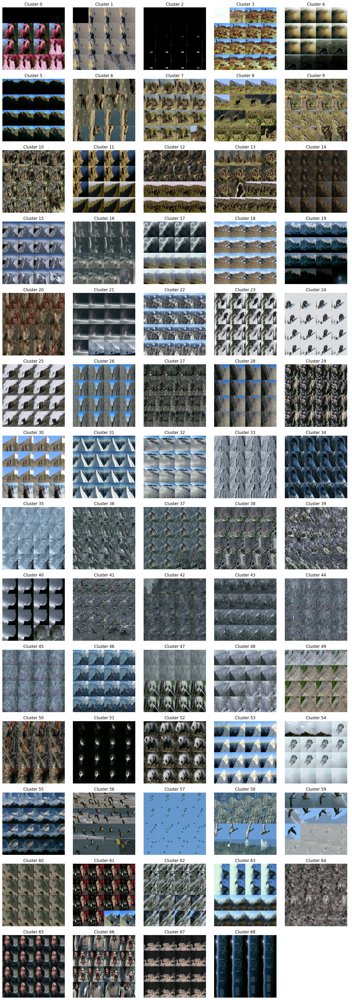

In [6]:

c, num_clust, req_c = FINCH(features, tw_finch=True)
print("The number of the found clusters in the individual clusterings is: ",num_clust)
timeslots_per_cluster = get_time_slots_per_clusterings(c)

image_paths_ = dataset.get_image_paths()
image_paths = np.array([[i] for i in image_paths_])

cluster_id = 3
print('Cluster Visualization based on the extracted embeddings and T-SNE')
plot_tsne(reduced, labels=c[:,cluster_id], verbose=False, savefig=True)
print('Visualization of the clusters along the timeline')
plot_label_timeline(c[:,cluster_id], show_axes=False)
print('Visualization of samples within the individual clusters')
plot_cluster_images(dataset_samples=image_paths, cluster_labels=c[:,cluster_id], clusters_per_row=5, images_per_cluster=16)


## Build a CLIP‐based text retrieval over clusters and extract top‐cluster GIFs

This block demonstrates how to turn each cluster into a “pseudo‐document” by computing its centroid embedding, then run a text query against those centroids using a CLIP model. Steps include:

-   Load the same SigLIP2 CLIP model used for feature extraction and move it to the compute device.

-   For a chosen clustering level (cluster_id = 2), compute the mean feature vector for every cluster (the centroid). Normalize each centroid to unit length.

-   Define retrieve_clusters(query, threshold, top_k), which:

    -    Tokenizes and encodes a text query.

    -   Computes cosine similarity between the query embedding and each cluster centroid.

    -   Returns up to top_k cluster IDs whose similarity exceeds threshold.

-   Run a sample query (“Footage of a snow leopard”) to demonstrate how cluster IDs are ranked by similarity.

-   Given the top‐hit clusters, pull out the corresponding frame file paths and timeline slots, then use extract_gifs_from_video to generate small GIF snippets for those clusters.

-   Finally, display a grid of sample frames from the retrieved clusters (with plot_cluster_images).

With this machinery, you can perform zero‐shot, text‐based retrieval of temporally coherent segments without any manual annotation.

Clusters matching 'Footage of a snow leopard': [(109, 0.18723630905151367), (117, 0.1788356453180313), (108, 0.17439857125282288), (111, 0.17290514707565308), (112, 0.16635343432426453)]
Creating GIF for clip 0 from 00:26:14.500 to 00:26:37.500...
Creating GIF for clip 1 from 00:28:22.000 to 00:28:29.500...
Creating GIF for clip 2 from 00:26:02.000 to 00:26:14.500...
Creating GIF for clip 3 from 00:26:43.000 to 00:26:54.000...
Creating GIF for clip 4 from 00:27:03.000 to 00:27:29.500...
Generated 5 GIFs in gifs


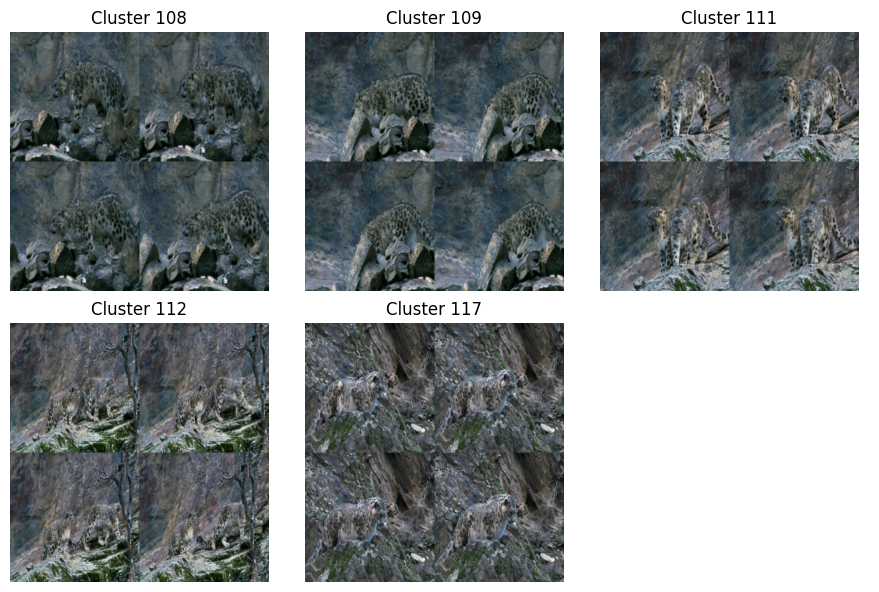

In [7]:

# Load CLIP model for text embedding (use same as feature extractor)
model_name = model_dict['siglip2']  # assumes model_dict available
clip_model, _ = create_model_from_pretrained(model_name)
clip_model = clip_model.to(device).eval()
tokenizer = get_tokenizer(model_name)

# Pre-compute cluster centroids (mean feature per segment)
# Assume `labels` is the segmentation vector for each frame (length matches features)
cluster_id = 2
labels_seg = c[:,cluster_id]
unique_labels = np.unique(labels_seg)
centroids = {}
for lab in unique_labels:
    centroids[lab] = features[labels_seg == lab].mean(axis=0)
centroid_matrix = np.stack([centroids[lab] for lab in unique_labels])  # shape (num_clusters, feat_dim)

# Normalize centroids
centroid_tensor = torch.from_numpy(centroid_matrix)
centroid_norm = centroid_tensor / centroid_tensor.norm(dim=1, keepdim=True)

# Retrieval function
def retrieve_clusters(
    query: str,
    threshold: float = 0.0,
    top_k: int = 5,
) -> list:
    """
    Given a text query, return segment labels whose centroids have
    cosine similarity >= threshold with the query embedding.
    """
    with torch.no_grad():
        # Tokenize and encode query
        tokens = tokenizer([query], context_length=clip_model.context_length)
        text_embed = clip_model.encode_text(tokens.to(device)).cpu()
        text_norm = text_embed / text_embed.norm(dim=1, keepdim=True)  # shape (1, D)

        # Compute cosine similarities
        
        sims = (text_norm @ centroid_norm.T).squeeze(0).cpu().numpy()  # shape (num_clusters,)

    # Filter
    hits = [(int(lab), float(sim)) for lab, sim in zip(unique_labels, sims) if sim >= threshold]
    # sort by descending similarity
    hits = sorted(hits, key=lambda x: x[1], reverse=True)[:top_k]
    return hits

# Example usage
query = "Footage of a snow leopard"
hits = retrieve_clusters(query, threshold=0.0)
print(f"Clusters matching '{query}':", hits)

hits = [x[0] for x in hits]
samples = image_paths[np.isin(labels_seg, hits)]
masks = labels_seg[np.isin(labels_seg, hits)]


extract_gifs_from_video(video_path, [timeslots_per_cluster[cluster_id][i][0] for i in hits], output_dir='./gifs', scale_width=480, fps=12)

plot_cluster_images(samples, masks, cluster_names=None, clusters_per_row=3, images_per_cluster=4)

## Use Llava to generate natural‐language descriptions of clusters

In the final block, we load a pretrained Llava vision-language model (“llava-hf/llava-interleave-qwen-0.5b-hf”) and its associated processor. We define describe_cluster(hit_id), which:

-   Gathers all frame file paths belonging to a chosen cluster (hit_id) at the selected clustering level.

-   Opens every third frame (to limit the number of images).

-   Constructs a multimodal prompt that interleaves <image> tokens with the user’s query string.

-   Uses Llava to generate a free‐form, detailed description of what’s happening in that segment of the video.

Finally, we call describe_cluster(4) to show an example description for retrieval index 4. You can loop over different clusters or supply your own questions to Llava to explore various parts of the video in natural language

In [22]:

model_id = "llava-hf/llava-interleave-qwen-0.5b-hf"

processor = LlavaProcessor.from_pretrained(model_id)

model = LlavaForConditionalGeneration.from_pretrained(model_id, torch_dtype=torch.float16)
model.to("mps")


def describe_cluster(hit_id):
    cluster_frames = np.array(dataset.get_image_paths())[c[:,cluster_id] == hits[hit_id]].tolist()
    print(len(cluster_frames))
    frames = [Image.open(frame) for frame in cluster_frames][::3]

    user_prompt = "What is happening in this video in detail?"
    toks = "<image>" * len(frames)
    prompt = "<|im_start|>user"+ toks + f"\n{user_prompt}<|im_end|><|im_start|>assistant"
    inputs = processor(text=prompt, images=frames, return_tensors="pt").to(model.device, model.dtype)

    output = model.generate(**inputs, max_new_tokens=100, do_sample=False)
    print(processor.decode(output[0][2:], skip_special_tokens=True)[len(user_prompt)+10:])

describe_cluster(4)


53


Setting `pad_token_id` to `eos_token_id`:151645 for open-end generation.


 The video shows a solitary mountain lion with a distinctive coat pattern of black and white spots on its body, moving across a rocky terrain.
